# 🪨 Track 2: Petrographic Thin Sections

### HACKATHON AI FOR OIL & GAS

#### Team: **Rock the Net**

**Members:**
* Matheus do Ó
* João Nogueira
* Juan David Nieto
* Hanna Rodrigues

---

# 1. Introduction

## The Challenge

The task consists of **classifying lithologies in petrographic thin-section images** of **synthetic carbonate rocks** generated by a GAN model trained using real Petrobras data.

The goal is to develop a model that receives a **thin-section image** as input and outputs the corresponding **carbonate lithology class**, from the following categories:

* **ESF** — Esferulitito (Spherulitic)
* **ETR** — Estromatólito (Stromatolitic)
* **RET** — Retrabalhado (Reworked)
* **LMT** — Laminito (Laminated)

---

## Dataset Description

### **Training Set**

* **1,100 synthetic carbonate thin-section images** generated from real data
* **Resolution:** 256 × 256 pixels
* **Labels:** encoded in the filename

### **Test Set**

* **446 images**
* **Resolution:** 512 × 512 pixels
* **No labels provided**
  
---

## Evaluation Metrics

The following metrics are used to assess model performance:

* **Confusion Matrix (raw):** absolute number of correct and incorrect predictions
* **Confusion Matrix (normalized):** class-wise proportional performance
* **Precision:** correctness of positive predictions per class
* **Recall:** ability to identify real samples of each class
* **F1-Score:** harmonic mean of precision and recall
* **Support:** number of real samples per class

---

## Main Goal

* **Primary Metric:** Accuracy and F1-Score
* **Approach:** We implemented a two-phase Transfer Learning strategy with **ResNeXt-50**, utilizing Weighted Sampling and Class Weight Boosting to combat class imbalance and maximize generalization capability on minority classes.

# Imports

In [1]:
# Essential Python Libraries 
import os
import random
import time
from collections import defaultdict, Counter

# Data Manipulation and Visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2

# PyTorch 
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

# Torchvision
import torchvision.transforms as T
import torchvision.models as models

# Utilities and ML Tools 
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, confusion_matrix
from tqdm import tqdm
from tqdm.auto import tqdm 

# Custom Helpers 
from helpers_laminas import * 
set_seed(42)

from pathlib import Path

/opt/venvs/torch/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 1. Exploratory Data Analysis

The training data presents natural variations in illumination, focus, texture, and the presence of artifacts. This reflects a realistic geological scenario, where models are typically trained on imperfect data, often originating from older wells, where image acquisition was much more manual. As shown below:

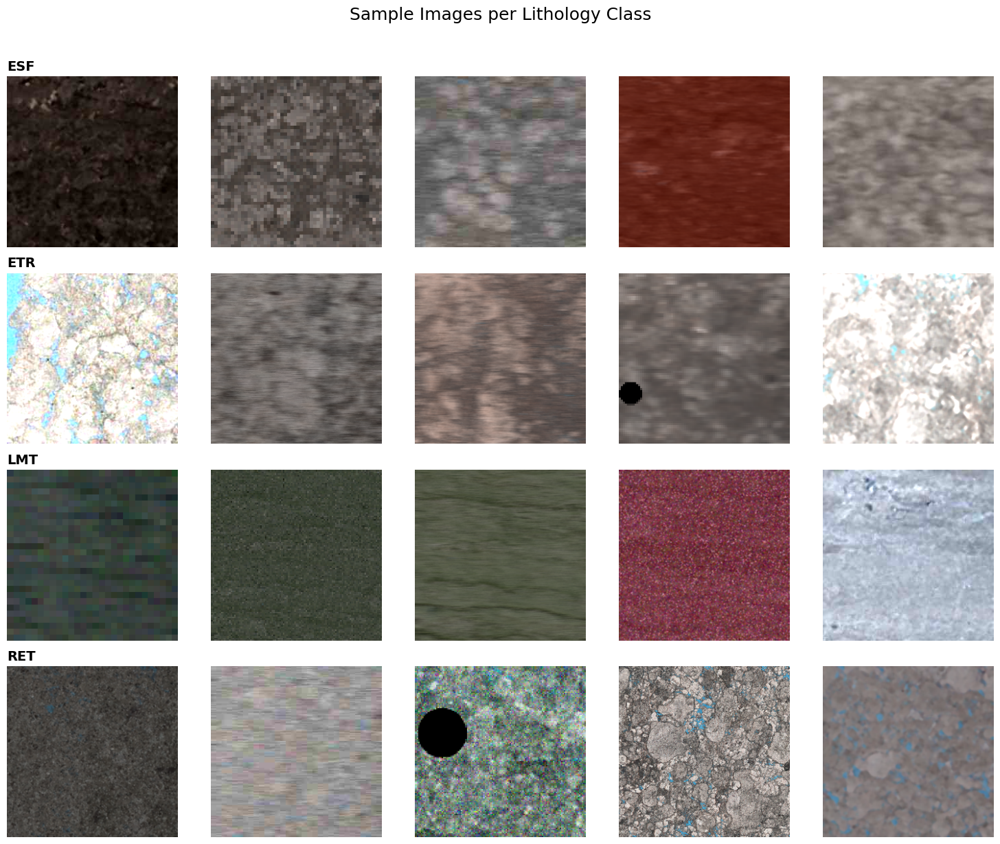

In [2]:
plot_class_samples()

#### Data Balance and Black Dot Quantification

In addition, we observe a noticeable class imbalance across the dataset, which must be addressed. Another highly relevant issue is the presence of black artifacts within the images.

To understand the impact of these artifacts, we analyzed all images containing more than 5% black pixels. The distribution of these cases is shown in the following chart.

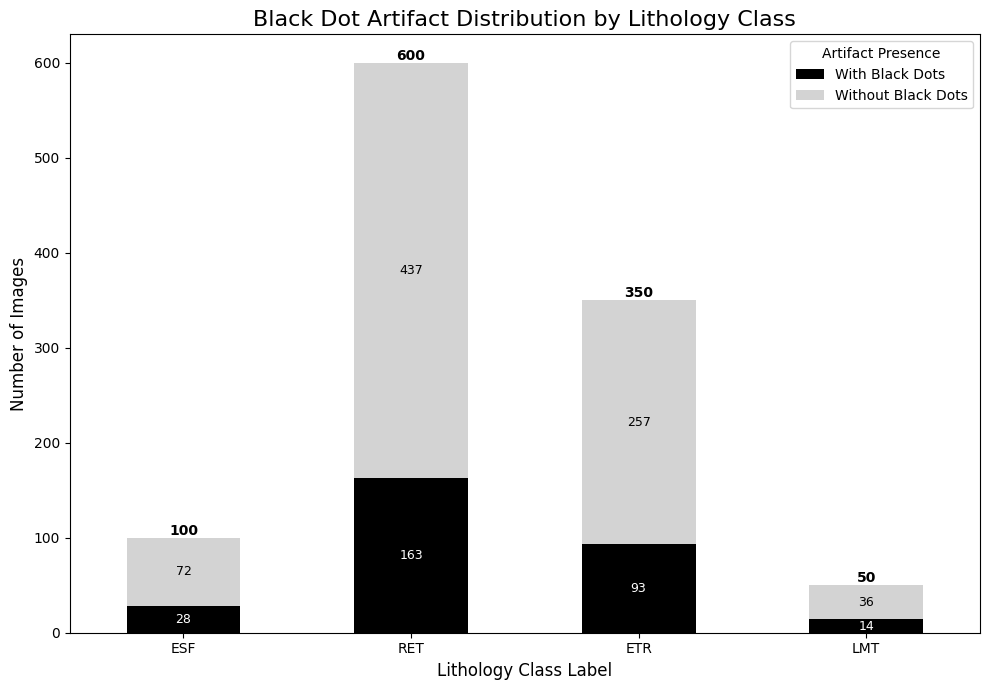

In [3]:
analyze_black_dot_artifacts()

# 2. Preprocessing

**1. Artifact Robustness via RandomErasing**: The pipeline implements *RandomErasing* augmentation to simulate occlusion artifacts. This trains the model to be robust and generalize even when parts of the slide texture are obscured.

**2. Strategic Class Weight Boosting:** We use a multiplier on the already calculated class weights to amplify the penalty for misclassifying rare geological samples (e.g., Laminite). This forces the model to focus training efforts on minority classes.

**3. Balanced Data Flow:** A WeightedRandomSampler is implemented, utilizing the adjusted weights to dynamically sample data and guarantee that batches are always class-balanced, ensuring minority classes are adequately represented in every epoch.

In [2]:
# Run the function to initialize global PyTorch components
TRAIN_LOADER, VAL_LOADER, CLASS_WEIGHTS, NUM_CLASSES, LABEL_MAP = create_dataloaders(
    data_dir=TRAIN_DIR,
    val_split_ratio=VAL_SPLIT_RATIO,
    img_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
)

Adjusted Class Weights: tensor([22.0000,  3.7714, 44.0000,  1.8333])


# 3. Modeling

We used a **ResNeXt-50** architecture, a modified variant of ResNet-50 that is particularly effective for texture-focused tasks. The model was initialized with ImageNet pretrained weights, and we replaced the final fully connected layer with a **spatial dropout layer** followed by a linear classifier.

Our training strategy consisted of two stages:

* **Backbone frozen** for the first **50 epochs**
* **Fine-tuning** for **100 additional epochs**, with all layers unfrozen

For optimization, we employed a **weighted cross-entropy loss**, using class weights computed during preprocessing.

## 3.1 Frozen

Model: ResNeXt-50 ready. Only FC layer trained with LR=0.001 and L2=0.0001.

Starting Feature Extraction for 50 epochs.


Overall Training Progress: 100%|██████████| 50/50 [05:53<00:00,  7.07s/it, TLoss=0.5760, VLoss=0.9650, VAcc=0.6136, Time=7.7s]



--- Feature Extraction Complete ---
Best Validation Accuracy achieved: 0.6864
Generating training history plots...


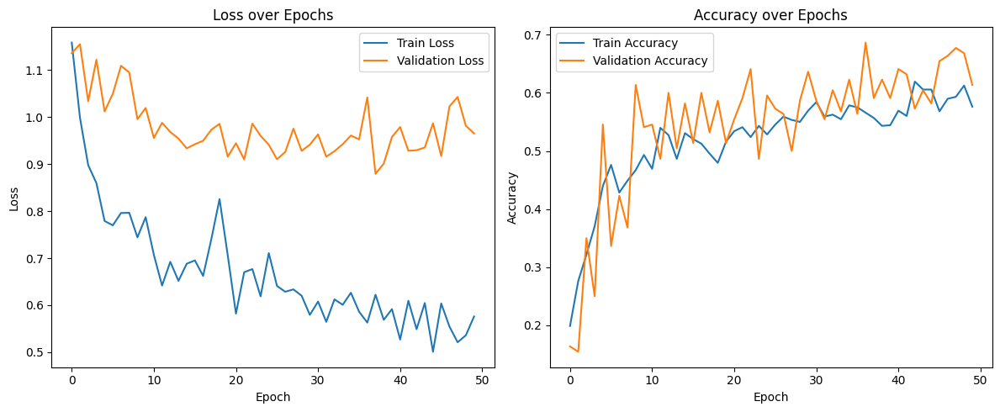

In [3]:
# --- HYPERPARAMETER CONFIGURATION ---
NUM_EPOCHS = 50
LEARNING_RATE = 0.001
WEIGHT_DECAY_L2 = 0.0001

# 1. Load Pre-trained Model (ResNeXt-50)
model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V1)

# 2. Freeze Feature Extraction Layers
for param in model.parameters():
    param.requires_grad = False

# 3. Replace the Classifier (model.fc)
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout1d(p=0.2),  # Regularization
    nn.Linear(num_ftrs, NUM_CLASSES)
)

# 4. Move Model to Device
model = model.to(DEVICE)

# 5. Define Loss and Optimizer
# Loss: Use calculated CLASS_WEIGHTS for handling class imbalance
criterion = nn.CrossEntropyLoss(weight=CLASS_WEIGHTS).to(DEVICE)

# Optimizer: Only optimize the newly added FC layer (Feature Extraction Phase)
optimizer = torch.optim.Adam(
    model.fc.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY_L2  # L2 Regularization
)

print(f"Model: ResNeXt-50 ready. Only FC layer trained with LR={LEARNING_RATE} and L2={WEIGHT_DECAY_L2}.")

# -------------------------------------------------------------------
# Main Training Execution (Feature Extraction)
# -------------------------------------------------------------------

# --- Configuration for Saving ---
SAVE_DIR = os.path.join(os.getcwd(), 'results_resnext')
MODEL_NAME = 'best_resnext_classifier.pth'
SAVE_PATH = os.path.join(SAVE_DIR, MODEL_NAME)

# 1. Initialize tracking variables
best_val_acc = 0.0
history = {
    'train_loss': [],
    'val_loss': [],
    'train_acc': [],
    'val_acc': []
}

# 2. Setup save directory
os.makedirs(SAVE_DIR, exist_ok=True)
print(f"\nStarting Feature Extraction for {NUM_EPOCHS} epochs.")

# --- Main Training Loop ---
main_pbar = tqdm(range(1, NUM_EPOCHS + 1), desc='Overall Training Progress')

for epoch in main_pbar:
    start_time = time.time()

    # Train and Validation Steps (defined externally)
    train_loss, train_acc = train_epoch(model, TRAIN_LOADER, criterion, optimizer, DEVICE)
    val_loss, val_acc = validate_epoch(model, VAL_LOADER, criterion, DEVICE)

    # Update History
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)

    # Update Progress Bar metrics
    main_pbar.set_postfix({
        'TLoss': f'{train_loss:.4f}',
        'VLoss': f'{val_loss:.4f}',
        'VAcc': f'{val_acc:.4f}',
        'Time': f'{(time.time() - start_time):.1f}s'
    })

    # Save best model based on validation accuracy
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), SAVE_PATH)

print("\n--- Feature Extraction Complete ---")
print(f"Best Validation Accuracy achieved: {best_val_acc:.4f}")

# --- Execute Plotting ---
print("Generating training history plots...")
plot_training_history(history)

## 3.2 Fine Tuning

Best Phase 1 ResNeXt model loaded from /home/hackathon/results_resnext/best_resnext_classifier.pth
All model layers have been 'unfrozen' for fine-tuning.
New Adam optimizer created with LR=5e-06 and L2=0.0001 for ALL parameters.

Starting Fine-Tuning for 100 epochs.


Fine-Tuning Progress: 100%|██████████| 100/100 [14:48<00:00,  8.89s/it, TLoss=0.2925, VLoss=0.7639, VAcc=0.8545, Time=8.8s]



--- Fine-Tuning Complete ---
Best Validation Accuracy (Phase 2) achieved: 0.8636
Final fine-tuned model saved to: /home/hackathon/results_resnext/finetuned_resnext_classifier.pth
Generating combined training history plots...


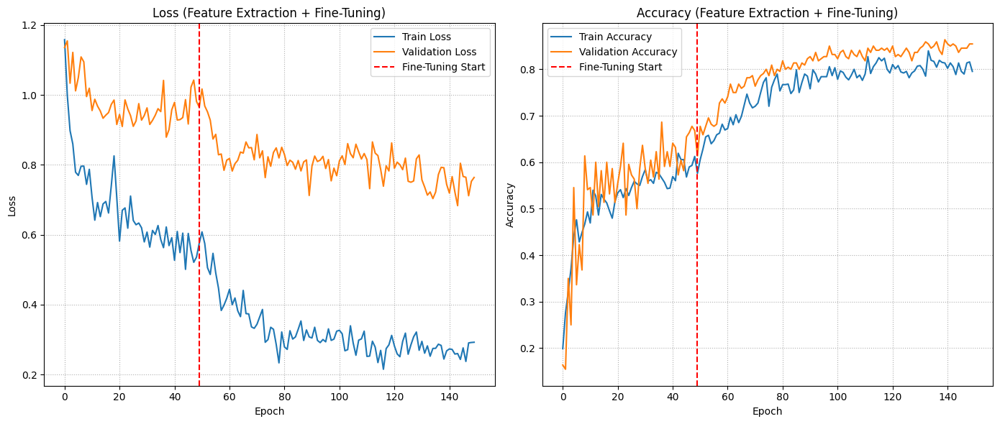

In [4]:
# --- HYPERPARAMETER CONFIGURATION ---
WEIGHT_DECAY_L2 = 0.0001 # L2 regularization maintained from Phase 1.
FT_LEARNING_RATE = 5e-6  # Significantly lower LR for fine-tuning.
FT_EPOCHS = 100          # Number of epochs for this phase.

# --- PATH CONFIGURATION ---
SAVE_DIR = os.path.join(os.getcwd(), 'results_resnext')
MODEL_NAME = 'best_resnext_classifier.pth'
BEST_MODEL_PATH = os.path.join(SAVE_DIR, MODEL_NAME)

# Path for the final fine-tuned model
MODEL_NAME_FT = 'finetuned_resnext_classifier.pth'
SAVE_PATH_FT = os.path.join(SAVE_DIR, MODEL_NAME_FT)

# --- LOAD BEST MODEL AND UNFREEZE ALL LAYERS ---

try:
    # Load the best weights from the Feature Extraction phase (Phase 1)
    model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=DEVICE))
    model.to(DEVICE)
    print(f"Best Phase 1 ResNeXt model loaded from {BEST_MODEL_PATH}")
except FileNotFoundError:
    print(f"ERROR: Model not found at {BEST_MODEL_PATH}. Check training directory.")
    raise

# Key step: Enable gradient calculation for ALL layers (Fine-Tuning)
for param in model.parameters():
    param.requires_grad = True

print("All model layers have been 'unfrozen' for fine-tuning.")

# --- CREATE NEW OPTIMIZER ---

# Initialize a new Adam optimizer to track ALL model parameters
optimizer_ft = torch.optim.Adam(
    model.parameters(),
    lr=FT_LEARNING_RATE,
    weight_decay=WEIGHT_DECAY_L2 # L2 Regularization maintained
)

print(f"New Adam optimizer created with LR={FT_LEARNING_RATE} and L2={WEIGHT_DECAY_L2} for ALL parameters.")


# --- FINE-TUNING TRAINING LOOP ---

# Copy and prepare history trackers
try:
    history_phase1 = history.copy()
except NameError:
    # Handles case where Phase 1 was skipped or history wasn't stored
    history_phase1 = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

history_ft = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

# Start tracking from the best accuracy achieved in Phase 1
try:
    best_val_acc_ft = best_val_acc
except NameError:
    best_val_acc_ft = 0.0

print(f"\nStarting Fine-Tuning for {FT_EPOCHS} epochs.")

main_pbar_ft = tqdm(range(1, FT_EPOCHS + 1), desc='Fine-Tuning Progress')

for epoch in main_pbar_ft:
    start_time = time.time()

    train_loss, train_acc = train_epoch(model, TRAIN_LOADER, criterion, optimizer_ft, DEVICE)
    val_loss, val_acc = validate_epoch(model, VAL_LOADER, criterion, DEVICE)

    # Update history
    history_ft['train_loss'].append(train_loss)
    history_ft['train_acc'].append(train_acc)
    history_ft['val_loss'].append(val_loss)
    history_ft['val_acc'].append(val_acc)

    main_pbar_ft.set_postfix({
        'TLoss': f'{train_loss:.4f}',
        'VLoss': f'{val_loss:.4f}',
        'VAcc': f'{val_acc:.4f}',
        'Time': f'{(time.time() - start_time):.1f}s'
    })

    # Save the new best model (based on combined best performance)
    if val_acc > best_val_acc_ft:
        best_val_acc_ft = val_acc
        torch.save(model.state_dict(), SAVE_PATH_FT)

print("\n--- Fine-Tuning Complete ---")
print(f"Best Validation Accuracy (Phase 2) achieved: {best_val_acc_ft:.4f}")
print(f"Final fine-tuned model saved to: {SAVE_PATH_FT}")

# --- PLOT COMBINED TRAINING HISTORY ---

# Combine the history dictionaries from Training and Fine-Tuning
combined_history = {
    'train_loss': history_phase1.get('train_loss', []) + history_ft['train_loss'],
    'val_loss': history_phase1.get('val_loss', []) + history_ft['val_loss'],
    'train_acc': history_phase1.get('train_acc', []) + history_ft['train_acc'],
    'val_acc': history_phase1.get('val_acc', []) + history_ft['val_acc']
}

# Determine the epoch where the fine-tuning phase began
ft_start_epoch = len(history_phase1.get('train_loss', []))

print("Generating combined training history plots...")

plot_combined_history(combined_history, ft_start_epoch)

# 4. Results 

This section configures the final evaluation. It loads the best fine-tuned weights, sets the model to evaluation mode, and prepares the class labels for reporting. Finally, it executes the comprehensive evaluation pipeline to generate the F1 scores and Confusion Matrices for both the training and validation sets.

--- Final Evaluation Setup ---
Successfully loaded BEST model weights from /home/hackathon/results_resnext/finetuned_resnext_classifier.pth


Evaluating Validation Set: 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]




--- Final TRAINING SET Metrics ---
F1-Score per Class:
  ESF: 0.9957
  ETR: 0.9961
  LMT: 1.0000
  RET: 0.9963
Macro Average F1 Score: 0.9970


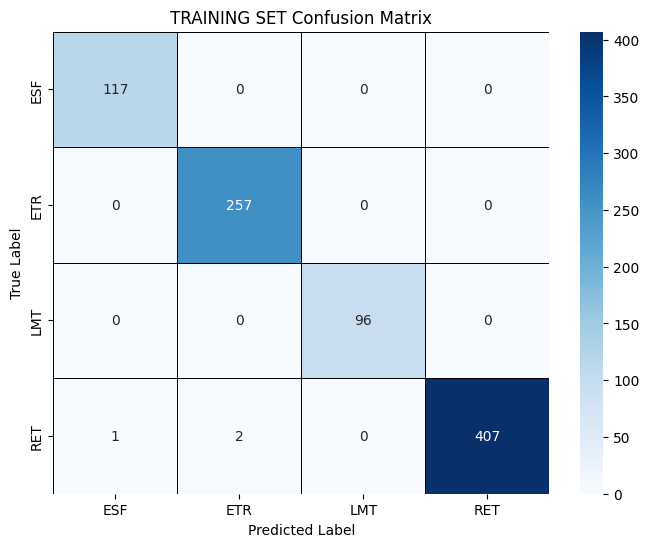



--- Final VALIDATION SET Metrics ---
F1-Score per Class:
  ESF: 0.6829
  ETR: 0.8633
  LMT: 0.7000
  RET: 0.9083
Macro Average F1 Score: 0.7886


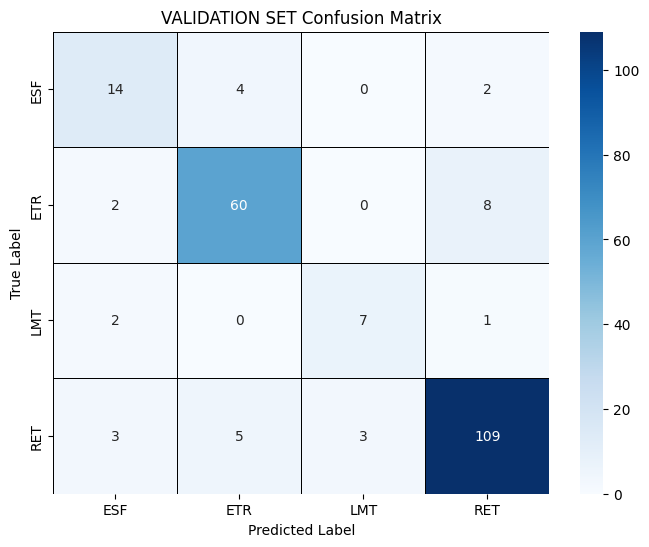

In [6]:
# --- CRITICAL CONFIGURATION ---
FT_DROPOUT_RATE = 0.2  # Must match the value used during the Fine-Tuning.
SAVE_DIR = os.path.join(os.getcwd(), 'results_resnext')
MODEL_NAME = 'finetuned_resnext_classifier.pth'
BEST_MODEL_PATH = os.path.join(SAVE_DIR, MODEL_NAME)

# --- Label Mapping ---
# Map indices back to class names for readable reports/plots
INV_LABEL_MAP = {v: k for k, v in LABEL_MAP.items()}
CLASS_LABELS = [INV_LABEL_MAP[i] for i in range(NUM_CLASSES)]

# Initialize the base ResNeXt-50 architecture with pre-trained weights
model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V1)
num_ftrs = model.fc.in_features

# CRITICAL FIX: Re-initialize the classifier layer (model.fc) EXACTLY as it was trained 
# during the two phases (Linear layer preceded by Dropout).
model.fc = nn.Sequential(
    nn.Dropout1d(p=FT_DROPOUT_RATE),
    nn.Linear(num_ftrs, NUM_CLASSES)
)

# Move the freshly structured model to the designated device
model.to(DEVICE)

# --- Execution ---

run_evaluation_pipeline(
    model=model,
    train_loader=TRAIN_LOADER,
    val_loader=VAL_LOADER,
    device=DEVICE,
    model_path=BEST_MODEL_PATH,
    class_labels=CLASS_LABELS
)

# 5. Final Prediction and Submission Export (Submitted)

This block executes the submission pipeline, which loads the best fine-tuned model and prepares the test data (patches).
The pipeline generates predictions for all test images, aggregates results, and exports them to the final submission file ('./pred.csv').

Since the test data is 512×512, we chose to crop it into 224×224 patches using a stride of 112 and saved in patches folder.

In [10]:
# --- Configuration  ---

TEST_DIR = "/home/hackathon/patches"
TEST_MANIFEST_PATH = './patch_manifest.csv'
SUBMISSION_FILE_PATH = './pred.csv'
# Load the fine-tuned ResNeXt model from the correct path
BEST_MODEL_PATH = os.path.join(os.getcwd(), 'results_resnext', 'finetuned_resnext_classifier.pth')
BATCH_SIZE = 32
NUM_WORKERS = os.cpu_count() // 2 if os.cpu_count() else 4

execute_submission_pipeline()

--- Final Prediction and Submission Export ---
Test manifest already exists at ./patch_manifest.csv. Skipping creation.
Successfully loaded model weights from /home/hackathon/results_resnext/finetuned_resnext_classifier.pth
Starting final inference...


Predicting Test Set: 100%|██████████| 126/126 [00:08<00:00, 14.59it/s]



 Aggregated 4014 patch predictions → 446 image predictions.

Submission file created successfully: ./pred.csv (Entries: 446)

--- First 5 lines of Submission ---
                              img classe
0  img_20251030_013629_885723.png    LMT
1  img_20251030_013629_886810.png    ETR
2  img_20251030_013629_887885.png    RET
3  img_20251030_013629_888505.png    LMT
4  img_20251030_013629_889092.png    ESF


# 6. 🧪 Extra AI Inpainting 

This section represents an **Extra Feature** of our Project, configuring a pipeline aimed at improving artifacts within the original dataset to enhance classification decisions. This idea arose from the persistent motivation to better address structural artifacts—specifically the black dots/occlusions—that represented a significant problem throughout the Hackathon.

First, the configuration for using **Stability AI Stable Diffusion Inpainting**, a generative AI model, is defined, along with its geological prompt which includes the names of our classes. The code executes the pipeline to automatically detect and correct structural artifacts in the original images. This results in a new corrected dataset intended to be used for initial testing during the inference stage of the classification model.

<img src="./Screenshot%20from%202025-11-14%2017-04-38.png" alt="Screenshot" width="600"/>


In [11]:
# Install ipywidgets in the specified environment
# This is necessary for tqdm to display progress bars correctly in Jupyter notebooks.
!/opt/venvs/torch/bin/python -m pip install ipywidgets --quiet

print("Installation of ipywidgets is complete.")
print("ATTENTION: Please RESTART THE KERNEL before proceeding to the next cell.")

Installation of ipywidgets is complete.
ATTENTION: Please RESTART THE KERNEL before proceeding to the next cell.


In [20]:
# --- 1. Configuration ---
MODEL_ID = "stabilityai/stable-diffusion-2-inpainting"
DEVICE = "cuda"

# Source Directory (Original Data)
ORIGINAL_SOURCE_DIR = Path("/home/hackathon/Lamina/train")
MANIFEST_PATH = Path("full_manifest.csv")

# New, isolated destination directory for corrected images
NEW_SOURCE_DIR = Path("/home/hackathon/corrected_data/train_v5") 

# Inpainting parameters
IMG_SIZE_INPAINT = 512  # SD-2 input size
IMG_SIZE_FINAL = 256    # Original training size
PROMPT = "carbonate rock, petrographic slide, geological texture, high resolution, realistic, Stromatolite, Spherulite, Laminite, Reworked"

if __name__ == "__main__":
    run_inpainting_pipeline(
        manifest_path=MANIFEST_PATH,
        original_dir=ORIGINAL_SOURCE_DIR,
        new_dir=NEW_SOURCE_DIR,
        model_id=MODEL_ID,
        device=DEVICE
    )

Output directory created at: /home/hackathon/train_corregido_v5
Loading Inpainting model (stabilityai/stable-diffusion-2-inpainting) onto the GPU...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Model loaded.
Processing 1100 images. This will take several minutes...


  0%|          | 0/1100 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

--- Offline Processing Complete! ---
AI Corrected Images (with holes): 92
Images Copied (clean or noisy): 1008
All images are ready in /home/hackathon/train_corregido_v5


### 6.1 Visualization

Loading original manifest: full_manifest.csv
Searching for 10 original images with black dots...


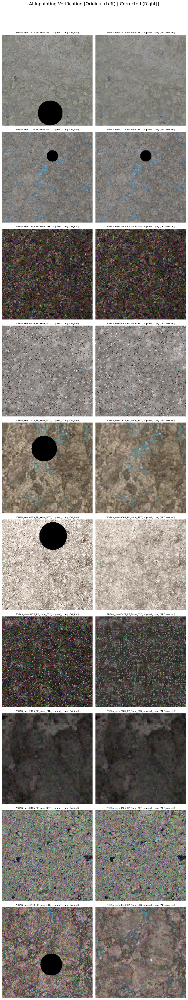

In [21]:
import os
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as T
import cv2 

# --- Configuration ---
# NOTE: The NEW_SOURCE_DIR from the previous cell is used here.
# Assuming USER_HOME = os.path.expanduser('~') is defined.
# Assuming IMG_SIZE (256) is defined.
ORIGINAL_SOURCE_DIR = "/home/hackathon/Lamina/train"
# The path where the corrected images were saved:
CORRECTED_SOURCE_DIR = os.path.join(os.path.expanduser('~'), "train_corregido_v5") 
ORIGINAL_MANIFEST = "full_manifest.csv"


# --- EXECUTION BLOCK ---
# Call the verification function
visualize_inpainting_correction(
    original_manifest_path=ORIGINAL_MANIFEST, 
    corrected_source_dir=CORRECTED_SOURCE_DIR, 
    num_samples=10
)

In [13]:
model_eval = initialize_final_model(FT_DROPOUT_RATE, NUM_CLASSES, DEVICE)

Recreating DataLoaders using AI-corrected data source...
Adjusted Class Weights: tensor([22.0000,  3.7714, 44.0000,  1.8333])

Starting Final Evaluation on AI-Corrected Dataset...
--- Final Evaluation Setup ---
Successfully loaded BEST model weights from /home/hackathon/results_resnext/finetuned_resnext_classifier.pth


Evaluating Validation Set: 100%|██████████| 7/7 [00:03<00:00,  1.99it/s]




--- Final TRAINING SET Metrics ---
F1-Score per Class:
  ESF: 0.9754
  ETR: 0.9825
  LMT: 1.0000
  RET: 0.9870
Macro Average F1 Score: 0.9862


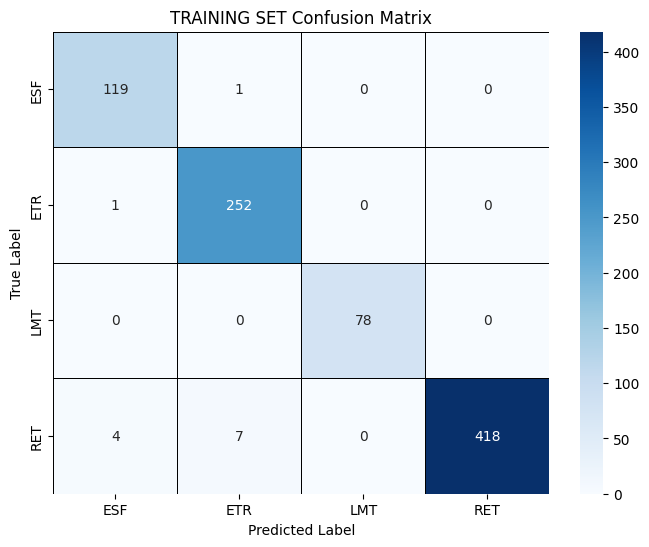



--- Final VALIDATION SET Metrics ---
F1-Score per Class:
  ESF: 0.6829
  ETR: 0.8613
  LMT: 0.6667
  RET: 0.9046
Macro Average F1 Score: 0.7789


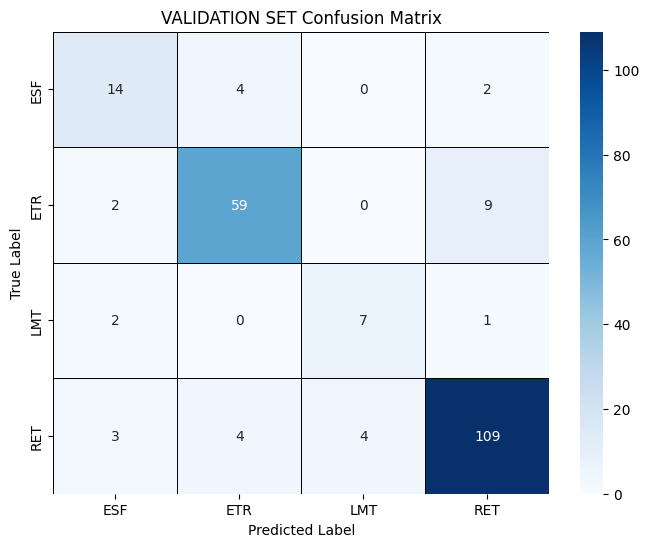

In [15]:
# Assumed configuration of the best model path
RESULTS_DIR = Path.cwd() / 'results_resnext'
MODEL_NAME_FT = 'finetuned_resnext_classifier.pth'
BEST_MODEL_PATH = RESULTS_DIR / MODEL_NAME_FT 

# New source directory containing the AI-corrected images
NEW_SOURCE_DIR = Path("/home/hackathon/train_corregido_v5")


# --- 1. Recreate DataLoaders with Corrected Data ---

print("Recreating DataLoaders using AI-corrected data source...")

# Recreate DataLoaders by pointing to the NEW_SOURCE_DIR
TRAIN_LOADER_CORRECTED, VAL_LOADER_CORRECTED, CLASS_WEIGHTS_NEW, NUM_CLASSES, LABEL_MAP_NEW = create_dataloaders(
    data_dir=NEW_SOURCE_DIR,
    val_split_ratio=0.2, 
    img_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

# Recreate the inverse label map for metric visualization
INV_LABEL_MAP = {v: k for k, v in LABEL_MAP_NEW.items()}
CLASS_LABELS = [INV_LABEL_MAP[i] for i in range(NUM_CLASSES)]

print("\nStarting Final Evaluation on AI-Corrected Dataset...")

# Use the run_evaluation_pipeline function to load weights, run inference, and display metrics
run_evaluation_pipeline(
    model=model_eval,
    train_loader=TRAIN_LOADER_CORRECTED, # Evaluate on the new Training set
    val_loader=VAL_LOADER_CORRECTED,     # Evaluate on the new Validation set
    device=DEVICE,
    model_path=BEST_MODEL_PATH,
    class_labels=CLASS_LABELS
)